notebook for developing the code for calculating cloud heterogeneity. 		
        1) Use particle-by-particle data
		2) Filter out all confidence<75% (also not)
		3) Record number of flips between phase
		4) Count # of flips in 1 sec
		5) Output # of particles
		6) Save both
		7) Make hist
		8) Make 2d hist with temp (use Rachel's code)
 

In [9]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import glob
%load_ext autoreload
%autoreload 2
print('loaded')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
loaded


In [12]:
psd_files = glob.glob('/home/disk/eos9/jkcm/Data/particle/psd/rf*_psd.nc')
psd_data = xr.open_mfdataset(psd_files, combine='by_coords')

In [13]:
het_files = glob.glob('/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf*_heterogeneity.nc')
het_data = xr.open_mfdataset(het_files, combine='by_coords')

In [43]:
a, b, c = np.intersect1d(psd_data.time.values, het_data.Time.values, return_indices=True)
liq_count = psd_data.count_darea_liq_ml.sum(dim='size_bin')
ice_count = psd_data.count_darea_ice_ml.sum(dim='size_bin')
mask = np.zeros(liq_count.shape, dtype='bool')
mask[b] = True
psd_data['mask'] = (('time'), mask)
match_liq_count = liq_count.where(psd_data.mask, drop=True)
match_ice_count = ice_count.where(psd_data.mask, drop=True)
het_data['liq_count'] = (('Time'), match_liq_count.values)
het_data['ice_count'] = (('Time'), match_ice_count.values)

In [46]:
het_data

<xarray.Dataset>
Dimensions:                 (Time: 354526, Vector100: 100, Vector129: 129, Vector257: 257, Vector31: 31, Vector63: 63, Vector64: 64, interarrival_endpoints: 41, sps1: 1)
Coordinates:
  * Time                    (Time) datetime64[ns] 2018-01-15T22:50:00 ... 2018-02-24T08:33:43
  * interarrival_endpoints  (interarrival_endpoints) float32 1e-07 ... 10.0
Dimensions without coordinates: Vector100, Vector129, Vector257, Vector31, Vector63, Vector64, sps1
Data variables:
    A1DC_RWOI               (Time, sps1, Vector64) float32 dask.array<chunksize=(26091, 1, 64), meta=np.ndarray>
    ACDP_RWIO               (Time, sps1, Vector31) float32 dask.array<chunksize=(26091, 1, 31), meta=np.ndarray>
    ACINS                   (Time) float32 dask.array<chunksize=(26091,), meta=np.ndarray>
    ADIFF                   (Time) float32 dask.array<chunksize=(280271,), meta=np.ndarray>
    ADIFR                   (Time) float32 dask.array<chunksize=(26091,), meta=np.ndarray>
    ALT       

In [91]:
liq_count = het_data['liq_count']
ice_count = het_data['ice_count']
liq_frac = liq_count/(ice_count + liq_count)
flips = het_data.phase_flip_counts
flip_frac = flips/het_data.all_particles_counts
bins = np.linspace(0, 1, 11)
digitized = np.digitize(liq_frac.values, bins, right=True).astype('float')
digitized[np.isnan(liq_frac.values)] = np.nan
binned_flips = []
for b in np.arange(len(bins)):
    binned_flips.append(flip_frac.values[digitized==b])
median_flips = [np.nanmedian(i) for i in binned_flips]
mean_flips = [np.nanmean(i) for i in binned_flips]

Text(0.5, 0, 'liquid particle fraction')

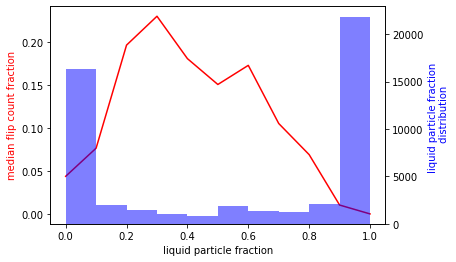

In [92]:
fig, ax = plt.subplots()
axr = ax.twinx()
hist = axr.hist(liq_frac, bins=bins, color='blue', alpha=0.5)
axr.set_ylabel('liquid particle fraction \n distribution', c='blue')
ax.plot(bins, median_flips, c='r')
ax.set_ylabel('median flip count fraction', c='r')
ax.set_xlabel('liquid particle fraction')

(array([16297.,  1991.,  1414.,   989.,   785.,  1877.,  1332.,  1281.,
         2108., 21842.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

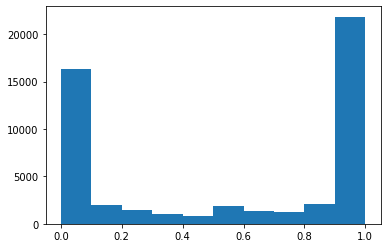

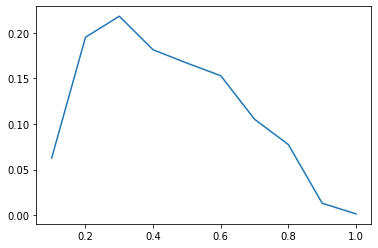

In [56]:
plt.plot(bins, median_flips)

In [49]:
len(flip_frac)

401715

In [24]:
psd_files

['/home/disk/eos9/jkcm/Data/particle/psd/rf01_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf02_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf03_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf04_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf05_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf06_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf07_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf08_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf09_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf10_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf11_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf12_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf13_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf14_psd.nc',
 '/home/disk/eos9/jkcm/Data/particle/psd/rf15_psd.nc']

In [25]:
het_files

['/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf01_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf02_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf03_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf04_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf05_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf06_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf07_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf08_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf09_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf10_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf11_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf12_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Data/particle/heterogeneity/rf13_heterogeneity.nc',
 '/home/disk/eos9/jkcm/Da

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import pickle
import os
from joblib import dump, load
import datetime
import matplotlib.pyplot as plt
import matplotlib as mpl

import glob
# from phase_psd import *
from run_psd import *
%load_ext autoreload
%autoreload 2

print('done')


done


In [2]:
from dask.distributed import Client, LocalCluster
from dask_jobqueue import PBSCluster
# cluster = PBSCluster(queue='workq', cores=8, memory='4GB', dashboard_address=':37188', walltime='04:00:00')
# cluster.scale(1)
cluster = LocalCluster(n_workers=16, dashboard_address=37188)
client = Client(cluster)


In [8]:
# cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
ERROR:asyncio:_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
concurrent.futures._base.CancelledError


In [3]:
#     all_flights = [f'rf{i:02}' for i in np.arange(1,16)]
#     for flt_string in all_flights[0:1]:
#         try:
# #             outfile = f'/home/disk/eos9/jkcm/Data/particle/psd/test/{flt_string}_psd.nc'
#             outfile =  f'/home/disk/eos9/jkcm/Data/particle/psd/test/test_{flt_string}_psd.nc'
#             navfilename = glob.glob('/home/disk/eos9/jfinlon/socrates/' + flt_string + '/*.PNI.nc')[0]
#             pbpfilename = '/home/disk/eos9/jfinlon/socrates/' + flt_string + '/pbp.' + flt_string + '.2DS.H.nc'
#             phasefilename = '/home/disk/eos9/jkcm/Data/particle/classified/' + 'UW_particle_classifications.' + flt_string + '.nc'
#             [flt_time, flt_tas] = load_nav(navfilename)
            
#             phase_data = xr.open_dataset(phasefilename)
#             nav_data = xr.open_dataset(navfilename)
#             new_nav_data = make_heterogeneity(phase_data, nav_data)
            
            
#             [time, diam_minR, diam_areaR, phase_ml, phase_holroyd, phase_ar, prob_ml, time_all, intArr, ovrld_flag] = load_pbp(
#                 pbpfilename, phasefilename, Dmin=0.05, Dmax=3.2, iatThresh=1.e-6)

#             psd = make_psd(flt_time, flt_tas, time, diam_minR, diam_areaR, phase_ml, prob_ml, phase_holroyd, phase_ar,
#             time_all, intArr, ovrld_flag, bootstrap=True, binEdges=None, tres=1, outfile=outfile)
#         except KeyboardInterrupt as e:
#             raise e
#         except Exception as e:
#             print(f'errora on flight {flt_string}:')
#             print(e)
#             continue

In [108]:
navfilename = glob.glob('/home/disk/eos9/jfinlon/socrates/rf11/*.PNI.nc')[0]
data = xr.open_dataset(navfilename)

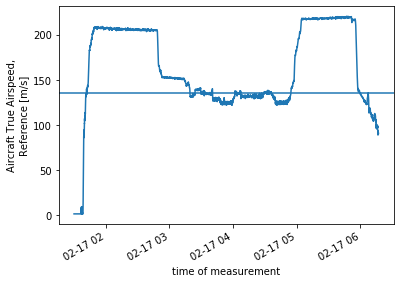

In [109]:
data.TASX.plot()
plt.axhline(135)

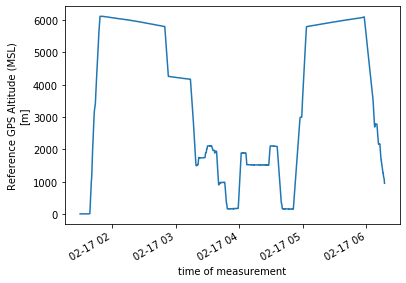

In [110]:
data.GGALT.plot()

In [4]:
    all_flights = [f'rf{i:02}' for i in np.arange(1,16)]
    all_data = {}
    for flt_string in all_flights[1:]:
        try:
            outfile = f'/home/disk/eos9/jkcm/Data/particle/psd/test/{flt_string}_heterogeneity.nc'
            navfilename = glob.glob('/home/disk/eos9/jfinlon/socrates/' + flt_string + '/*.PNI.nc')[0]
            pbpfilename = '/home/disk/eos9/jfinlon/socrates/' + flt_string + '/pbp.' + flt_string + '.2DS.H.nc'
            phasefilename = '/home/disk/eos9/jkcm/Data/particle/classified/' + 'UW_particle_classifications.' + flt_string + '.nc'
            [flight_time, flight_tas] = load_nav(navfilename)
            # [time, diam_minR, diam_areaR, phase_ml, phase_holroyd, phase_ar, prob_ml, time_all, intArr, ovrld_flag] = load_pbp(
            #     pbpfilename, phasefilename, Dmin=0.05, Dmax=3.2, iatThresh=1.e-6)
            phase_data = xr.open_dataset(phasefilename, chunks={})
            nav_data = xr.open_dataset(navfilename, chunks={})
            print(f'loaded pbp data, {flt_string}')
            new_nav_data = make_heterogeneity(phase_data, nav_data)
            all_data[flt_string] = new_nav_data
            new_nav_data.to_netcdf(outfile)
        except KeyboardInterrupt as e:
            raise e
        except Exception as e:
            print(f'error on flight {flt_string}:')
            raise e
            continue
            

loaded pbp data, rf02
here1
after resample
done with 1hz proc
done with all part count
loaded pbp data, rf03
here1
after resample
done with 1hz proc
done with all part count
loaded pbp data, rf04
here1
after resample
done with 1hz proc
done with all part count


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt

distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
ERROR:asyncio:Future exception was never retrieved
future: <Future finished exception=KeyError("('getitem-

In [7]:
het_data = xr.open_mfdataset('/home/disk/eos9/jkcm/Data/particle/psd/test/rf*_heterogeneity.nc', combine='by_coords', concat_dim='Time')

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/disk/p/jkcm/anaconda3/envs/classified-cset/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3331, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-7-b14ab200049d>", line 1, in <module>
    het_data = xr.open_mfdataset('/home/disk/eos9/jkcm/Data/particle/psd/test/rf*_heterogeneity.nc', combine='by_coords', concat_dim='Time')
  File "/home/disk/p/jkcm/anaconda3/envs/classified-cset/lib/python3.7/site-packages/xarray/backends/api.py", line 952, in open_mfdataset
    datasets, compat=compat, data_vars=data_vars, coords=coords, join=join
  File "/home/disk/p/jkcm/anaconda3/envs/classified-cset/lib/python3.7/site-packages/xarray/core/combine.py", line 623, in combine_by_coords
    join=join,
  File "/home/disk/p/jkcm/anaconda3/envs/classified-cset/lib/python3.7/site-packages/xarray/core/merge.py", line 605, in merge
    dict_like_objects, compat, join, fill_value=fill_value
  File "/ho

KeyboardInterrupt: 

In [44]:

temps, flips, counts, full_counts = np.array([]), np.array([]), np.array([]), np.array([])
all_flights = [f'rf{i:02}' for i in np.arange(1,15)]
for f in all_flights:
    with xr.open_dataset(f'/home/disk/eos9/jkcm/Data/particle/heterogeneity/{f}_heterogeneity.nc') as v:
        temps = np.append(temps, v.ATX.values)
        flips = np.append(flips, v.phase_flip_counts.values)
        counts = np.append(counts, v.particle_counts.values)
        full_counts = np.append(full_counts, v.all_particles_counts.values)
good_idx = np.all((~np.isnan(temps), ~np.isnan(flips), ~(counts==0), ~np.isnan(full_counts)), axis=0)
temps, flips, counts, full_counts = np.array(temps)[good_idx], np.array(flips)[good_idx], np.array(counts)[good_idx], np.array(full_counts)[good_idx]
norm_flips = flips/counts

Text(0.5, 1.0, '1hz heterogeneity metric histogram')

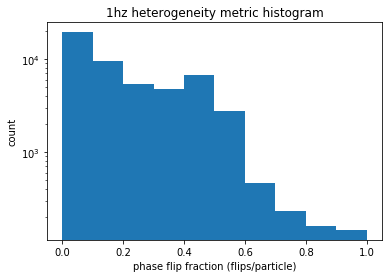

In [62]:
plt.hist(norm_flips, log=True)
plt.xlabel('phase flip fraction (flips/particle)')
plt.ylabel('count')
plt.title('1hz heterogeneity metric histogram')

In [86]:
plt.hist()

array([0.80984549, 0.52711966, 0.63138448, 0.94042124, 0.90183886,
       0.80949253, 0.82776658, 0.82252444, 0.86730772, 0.65674813,
       0.72363798, 0.76662774, 0.82442734, 0.84389139, 0.84239829,
       0.57246694, 0.82268061, 0.77396844, 0.63231654, 0.77893478,
       0.80838706, 0.68362407, 0.75772946, 0.77924924, 0.61087528,
       0.68869991, 0.91490068, 0.69449269, 0.77284098, 0.87396992,
       0.73309018, 0.86786705, 0.70956795, 0.71683386, 0.72578041,
       0.75587943, 0.70535355, 0.78623902, 0.82715408, 0.72311541,
       0.62665462, 0.91118895, 0.83626768, 0.64488953, 0.8942974 ,
       0.78153864, 0.5821038 , 0.73948397, 0.6923171 , 0.70247857,
       0.94849719, 0.68189746, 0.79952082, 0.8490155 , 0.72632822,
       0.71662387, 0.68031819, 0.63443892, 0.81719509, 0.74021772,
       0.62182934, 0.80099963, 0.56695111, 0.58856523, 0.76752717,
       0.80721522, 0.77234478, 0.60831848, 0.72154674, 0.73722796,
       0.67289614, 0.67453241, 0.56400034, 0.96035186, 0.76750

In [96]:
x = 0.72
size=10000
ice_probs = np.random.normal(x, scale=0.0, size=size)
liq_probs = 1-ice_probs


# ice_probs = prob_ml.copy()
#     ice_probs[phase_ml==1] = 1-ice_probs[phase_ml==1]  # probability that particle is ice
#     liq_probs = prob_ml.copy()
#     liq_probs[phase_ml==0] = 1-liq_probs[phase_ml==0]  # probability that particle is liquid
all_ice_prob = ice_probs[1:]*ice_probs[:-1]   # probability that a particle and its next neighbor are both ice
all_liq_prob = liq_probs[1:]*liq_probs[:-1]   # ditto but for liquid
all_ice_or_liq = all_ice_prob+all_liq_prob   #probability that a phase flip did not occur
phase_flip_prob = np.insert((1-all_ice_or_liq), 0, 0)
phase_flip_prob.sum()/size

0.40315968

17.819999999999993

In [49]:
np.arange(0,1,.1)

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

Text(0.5, 1.0, 'count-weighted heterogeneity')

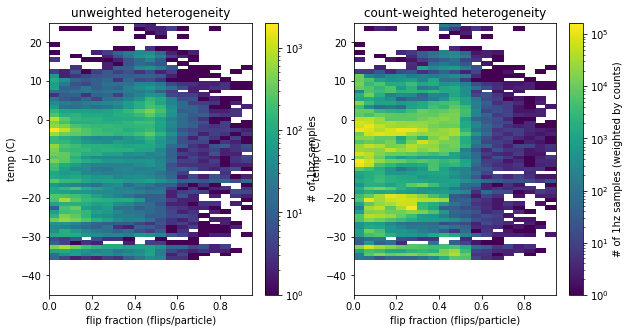

In [70]:
fig, [ax, ax2] = plt.subplots(ncols=2, figsize=(10,5))
hist = ax.hist2d(norm_flips, temps, bins=(np.arange(0,1,.05), np.arange(-45,26,1)), norm=mpl.colors.LogNorm())
cb= plt.colorbar(hist[3], ax=ax, label='# of 1hz samples')
ax.set_ylabel('temp (C)')
ax.set_xlabel('flip fraction (flips/particle)')
ax.set_title('unweighted heterogeneity')

# fig, ax2 = plt.subplots()
hist = ax2.hist2d(norm_flips, temps, weights=counts, bins=(np.arange(0,1,.05), np.arange(-45,26,1)), norm=mpl.colors.LogNorm())
cb= plt.colorbar(hist[3], ax=ax2, label='# of 1hz samples (weighted by counts)')
ax2.set_ylabel('temp (C)')
ax2.set_xlabel('flip fraction (flips/particle)')
ax2.set_title('count-weighted heterogeneity')

Text(0.5, 1.0, 'unweighted heterogeneity')

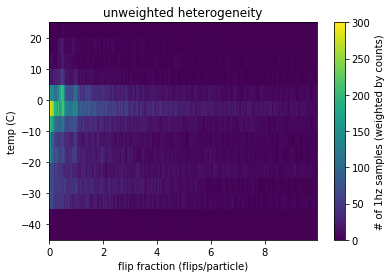

In [123]:

fig, ax2 = plt.subplots()
hist = ax2.hist2d(flips, temps, bins=(np.arange(0,1
ax.set_yscale('log')
# ax.set_xlim((1, 1e4))

ax.set_yscale('log'),.05), np.arange(-45,26,5)), vmax=300)
cb= plt.colorbar(hist[3], ax=ax2, label='# of 1hz samples (weighted by counts)')
ax2.set_ylabel('temp (C)')
ax2.set_xlabel('flip fraction (flips/particle)')
ax2.set_title('unweighted heterogeneity')

(array([   0., 5825., 3138., 2180., 1674., 1323., 1063.,  947.,  934.,
         807.,  753.,  670.,  673.,  610.,  570.,  549.,  481.,  505.,
         479.,  497.,  457.,  427.,  415.,  412.,  414.,  385.,  384.,
         336.,  356.,  337.,  347.,  320.,  310.,  300.,  296.,  263.,
         276.,  266.,  259.,  272.,  237.,  257.,  248.,  236.,  235.,
         221.,  210.,  226.,  206.,  197.,  212.,  226.,  168.,  207.,
         161.,  144.,  186.,  168.,  162.,  144.,  146.,  146.,  157.,
         146.,  136.,  129.,  125.,  132.,  146.,  141.,  137.,  112.,
          84.,  124.,  148.,  116.,   94.,  114.,  113.,  100.,   94.,
         122.,  111.,   92.,  101.,  102.,   99.,   95.,   92.,   95.,
          92.,   77.,   92.,   85.,   94.,   68.,   74.,   96.,  170.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 4

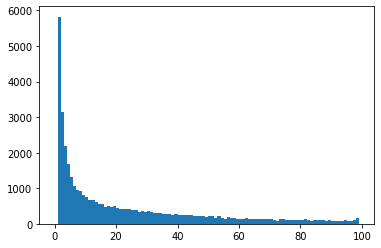

In [125]:
plt.hist(counts, bins=np.arange(0,100,1))

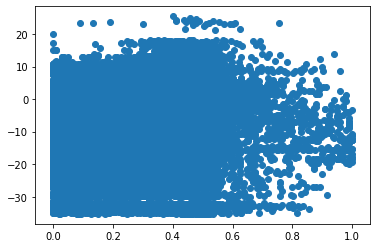

In [109]:
plt.scatter(norm_flips, tempsa)

(1, 2000.0)

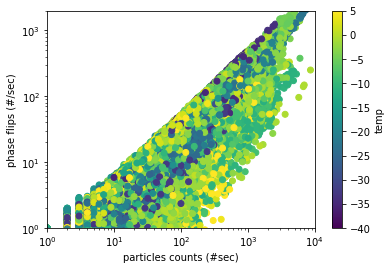

In [136]:
plot_idx = np.random.permutation(len(counts))

fig, ax = plt.subplots()
sc = ax.scatter(counts[plot_idx], flips[plot_idx], c=temps[plot_idx], vmin=-40, vmax=5)
# sc = ax.plot(counts[plot_idx], flips[plot_idx], '.')
ax.set_xlabel('particles counts (#sec)')
ax.set_ylabel('phase flips (#/sec)')
plt.colorbar(sc, ax=ax, label='temp')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim((1, 1e4))
ax.set_ylim((1, 2e3))

(1, 2000.0)

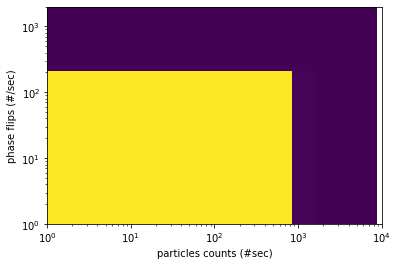

In [65]:
plot_idx = np.random.permutation(len(counts))

fig, ax = plt.subplots()
sc = ax.hist2d(counts[plot_idx], flips[plot_idx], bins=)
# sc = ax.plot(counts[plot_idx], flips[plot_idx], '.')
ax.set_xlabel('particles counts (#sec)')
ax.set_ylabel('phase flips (#/sec)')
# plt.colorbar(sc, ax=ax, label='temp')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim((1, 1e4))
ax.set_ylim((1, 2e3))

(10, 1000.0)

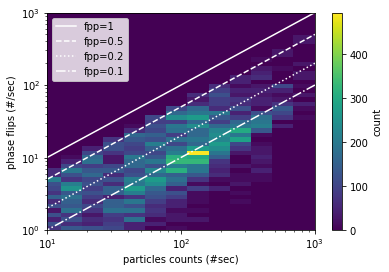

In [20]:
# plot_idx = np.random.permutation(len(counts))

fig, ax = plt.subplots()
# sc = ax.scatter(counts[plot_idx], flips[plot_idx], c=temps[plot_idx], vmin=-40, vmax=5)
xbins = 10**np.linspace(0, 3, 20)
ybins = 10**np.linspace(0, 3, 50)

_,_,_,sc = ax.hist2d(counts, flips, bins=(xbins, ybins),)
ax.set_xlabel('particles counts (#sec)')
ax.set_ylabel('phase flips (#/sec)')
ax.plot([1,1000],[1,1000], 'w', label='fpp=1')
ax.plot([1,1000],[0.5,500], '--w', label='fpp=0.5')
ax.plot([1,1000],[0.2,200], ':w', label='fpp=0.2')
ax.plot([1,1000],[0.1,100], '-.w', label='fpp=0.1')
plt.colorbar(sc, ax=ax, label='count')
ax.set_xscale('log')
ax.set_yscale('log')
plt.legend()
ax.set_xlim((10, 1e3))
# ax.set_ylim((1, 2e3))

In [ ]:
# plot_idx = np.random.permutation(len(counts))

fig, ax = plt.subplots()
# sc = ax.scatter(counts[plot_idx], flips[plot_idx], c=temps[plot_idx], vmin=-40, vmax=5)
xbins = 10**np.linspace(0, 5, 20)
ybins = 10**np.linspace(0, 5, 50)

_,_,_,sc = ax.hist2d(full_counts, flips, bins=(xbins, ybins), density=True)
ax.set_xlabel('all particle counts (#/sec)')
ax.set_ylabel('phase flips (#/sec)')

for val, ls in zip((0.5, 0.2, 0.05, 0.005), ('w', '--w', ':w', '-.w')):
    ax.plot([1,1e5],[val,1e5*val], ls, label=str(val))
    
plt.colorbar(sc, ax=ax, label='# of 1Hz samples')
ax.set_xscale('log')
ax.set_yscale('log')
plt.legend(title = 'flips per particle')
# ax.set_xlim((10, 1e3))


(array([[1.4323e+04, 1.3700e+02, 6.4000e+01, 3.2000e+01, 3.5000e+01,
         8.0000e+00, 1.1000e+01, 4.0000e+00, 5.0000e+00, 2.0000e+00],
        [1.2694e+04, 6.3800e+02, 4.9200e+02, 3.6700e+02, 1.9000e+02,
         1.1200e+02, 6.8000e+01, 4.4000e+01, 3.3000e+01, 2.4000e+01],
        [1.3490e+04, 4.8900e+02, 3.0500e+02, 2.1900e+02, 1.3100e+02,
         7.2000e+01, 3.2000e+01, 1.8000e+01, 1.8000e+01, 1.5000e+01],
        [9.2330e+03, 4.2400e+02, 2.1600e+02, 1.1800e+02, 6.5000e+01,
         2.0000e+01, 1.4000e+01, 1.2000e+01, 5.0000e+00, 1.0000e+00],
        [5.3490e+03, 3.4500e+02, 2.1500e+02, 1.3200e+02, 8.7000e+01,
         5.3000e+01, 3.8000e+01, 3.1000e+01, 2.8000e+01, 2.2000e+01],
        [7.3480e+03, 6.2400e+02, 3.3500e+02, 1.7200e+02, 1.2500e+02,
         1.0500e+02, 8.4000e+01, 8.3000e+01, 6.3000e+01, 5.0000e+01],
        [1.1277e+04, 9.8300e+02, 4.5000e+02, 2.6900e+02, 1.5900e+02,
         1.1500e+02, 8.7000e+01, 7.4000e+01, 6.6000e+01, 5.4000e+01],
        [1.3591e+04, 8.5800

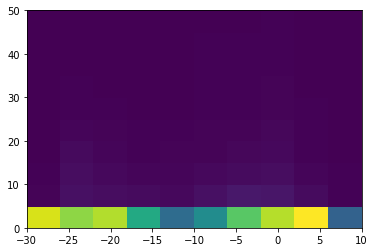

In [107]:
plt.hist2d(temps, flips, range=((-30,10),(0,50)))

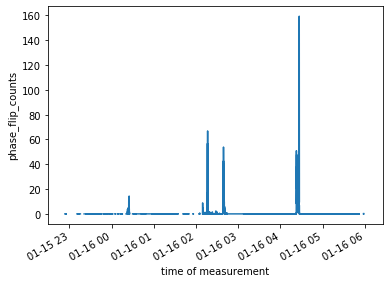

In [93]:
nav_data.phase_flip_counts.plot()

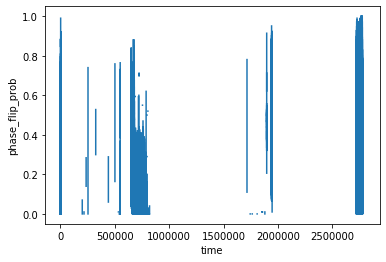

In [50]:
phase_data['phase_flip_prob'].plot()

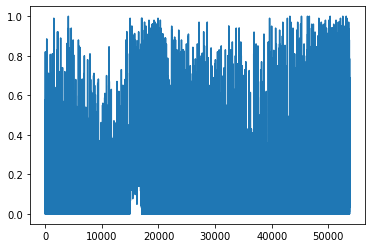

In [41]:
plt.plot(phase_flip_prob[~np.isnan(phase_flip_prob)])

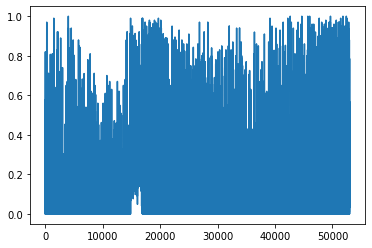

In [20]:
plt.plot(phase_flip_prob)

In [24]:
time

array(['2018-01-15T22:48:49.000000000', '2018-01-15T22:48:49.000000000',
       '2018-01-15T22:48:49.000000000', ...,
       '2018-01-16T04:27:13.000000000', '2018-01-16T05:58:24.000000000',
       '2018-01-16T06:04:11.000000000'], dtype='datetime64[ns]')

In [22]:
phase_flip_prob.shape

(53009,)

(array([36364.,  5223.,  3138.,  2424.,  2076.,  1729.,   890.,   539.,
          394.,   231.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

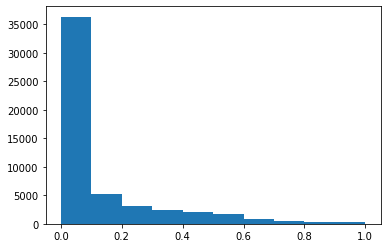

In [18]:
plt.hist(phase_flip_prob)

In [79]:
good_filt = prob_ml>0.95
good_filt = ~np.isnan(prob_ml)
good_flips = np.insert(np.abs(np.diff(phase_ml[good_filt])), 0, 0) # where the phase changes
good_time = time[good_filt]

In [80]:
good_flips.shape

(53009,)

In [81]:
np.sum(good_flips)

3670.0

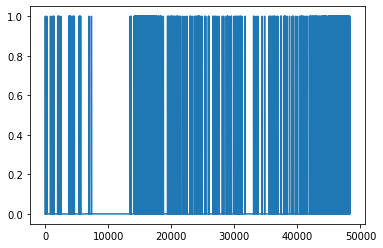

In [78]:
plt.plot(flips)

In [36]:
# make_heterogeneity():
if True:
    # Prepare the 1 Hz time loop and allocate PSD arrays
    dur = (flight_time[-1] - flight_time[0]) / np.timedelta64(1, 's') # flight duration [s]
    num_times = int(dur) + 1 # include the last second of flight

In [42]:
unique_ptime, unique_ptime_inverse = np.unique(good_time, return_inverse=True) # accepted particles

In [44]:
flttime_inds_ptime_all = np.where(np.isin(flight_time, particle_time_all)==True)[0] # all particles

array([  0,   0,   0, ..., 791, 792, 793])

In [3]:
import xarray as xr
import numpy as np
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt


#loading data
temps, flips, counts, full_counts = np.array([]), np.array([]), np.array([]), np.array([])
all_flights = [f'rf{i:02}' for i in np.arange(1,16)]
for f in all_flights:
    with xr.open_dataset(f'/home/disk/eos9/jkcm/Data/particle/heterogeneity/{f}_heterogeneity.nc') as v:
        temps = np.append(temps, v.ATX.values)
        flips = np.append(flips, v.phase_flip_counts.values)
        counts = np.append(counts, v.particle_counts.values)
        full_counts = np.append(full_counts, v.all_particles_counts.values)
good_idx = np.all((~np.isnan(temps), ~np.isnan(flips), ~(counts==0), ~np.isnan(full_counts)), axis=0)
temps, flips, counts, full_counts = np.array(temps)[good_idx], np.array(flips)[good_idx], np.array(counts)[good_idx], np.array(full_counts)[good_idx]
norm_flips = flips/counts
    

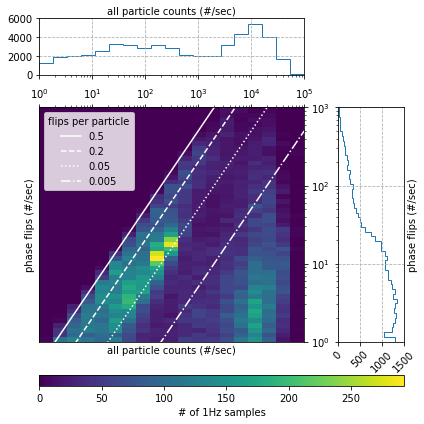

In [85]:
    
#plotting data    

gs = GridSpec(5,4, height_ratios=[1,1,1,1,0.2])

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(gs[1:4,0:3])
ax_marg_x = fig.add_subplot(gs[0,0:3], sharex=ax)
ax_marg_y = fig.add_subplot(gs[1:4,3], sharey=ax)
ax_cb = fig.add_subplot(gs[4, 0:4])


xbins = 10**np.linspace(0, 5, 20)
ybins = 10**np.linspace(0, 3, 50)

_,_,_,sc = ax.hist2d(full_counts, flips, bins=(xbins, ybins),)
ax.set_xlabel('all particle counts (#/sec)')
ax.set_ylabel('phase flips (#/sec)')
for val, ls in zip((0.5, 0.2, 0.05, 0.005), ('w', '--w', ':w', '-.w')):
    ax.plot([1,1e5],[val,1e5*val], ls, label=str(val))



plt.colorbar(sc, cax=ax_cb, label='# of 1Hz samples', orientation='horizontal')
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend(title = 'flips per particle')
# ax.set_xlim((10, 1e3))

# ax.tick_params(axis="x", bottom=False, top=True, labelbottom=False, labeltop=True)
# ax.tick_params(axis="x", bottom=False, top=True, labelbottom=False, labeltop=True)
ax.xaxis.tick_top()
ax.yaxis.tick_right()


ax_marg_x.hist(full_counts, histtype='step', bins=xbins)
# ax_marg_x.set_yscale('log')
ax_marg_x.set_yticks([0, 2e3, 4e3, 6e3])
ax_marg_x.grid(True, ls='--')
ax_marg_x.set_xlabel('all particle counts (#/sec)')
ax_marg_x.xaxis.set_label_position('top')

# ax_marg_x.set_yticklabels([1e3, 2e3])



ax_marg_y.hist(flips, histtype='step', orientation="horizontal", bins=ybins)
# ax_marg_y.set_xscale('log')
ax_marg_y.set_xticks([0, 5e2, 1e3, 1.5e3])
ax_marg_y.set_xticklabels([int(i) for i in ax_marg_y.get_xticks()], rotation=45)
ax_marg_y.grid(True, ls='--')
ax_marg_y.set_ylabel('phase flips (#/sec)')
ax_marg_y.yaxis.set_label_position('right')
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

plt.tight_layout(h_pad=0.1, w_pad=0.2)


In [1]:
#!/usr/bin/env conda run -n classified-cset python
# -*- coding: utf-8 -*-
"""plot particle heterogeneity 2d histogram
    Created by Johannes Mohrmann, March 6 2021"""

import xarray as xr
import numpy as np
import matplotlib
# matplotlib.use('Agg')
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

#loading data
temps, flips, counts, full_counts = np.array([]), np.array([]), np.array([]), np.array([])
all_flights = [f'rf{i:02}' for i in np.arange(1,15)]
for f in all_flights:
    with xr.open_dataset(f'/home/disk/eos9/jkcm/Data/particle/heterogeneity/{f}_heterogeneity.nc') as v:
        temps = np.append(temps, v.ATX.values)
        flips = np.append(flips, v.phase_flip_counts.values)
        counts = np.append(counts, v.particle_counts.values)
        full_counts = np.append(full_counts, v.all_particles_counts.values)
good_idx = np.all((~np.isnan(temps), ~np.isnan(flips), ~(counts==0), ~np.isnan(full_counts)), axis=0)
temps, flips, counts, full_counts = np.array(temps)[good_idx], np.array(flips)[good_idx], np.array(counts)[good_idx], np.array(full_counts)[good_idx]
norm_flips = flips/counts
    
    
#plotting data    

# fig,ax=plt.subplots(2,gridspec_kw={'height_ratios':[.8,.2]},\
#                     sharex=True,figsize=(6.4,6.4))
# #fig, ax = plt.subplots()
# xbins = 10**np.linspace(0, 5, 20)
# ybins = 10**np.linspace(0, 5, 50)

# _,_,_,sc = ax[0].hist2d(full_counts, flips, bins=(xbins, ybins),)
# ax[0].set_ylabel('Phase Flips '+r"(s$^{-1}$)",fontsize=14)
# ax[0].plot([1,1e5],[0.5*1,0.5*1e5], 'w', label='0.5')
# ax[0].plot([1,1e5],[0.02*1,0.02*1e5], '--w', label='0.02')
# ax[0].plot([1,1e5],[0.002*1,0.002*1e5], ':w', label='0.002')
# ax[0].plot([1,1e5],[0.00005*1,0.00005*1e5], '-.w', label='0.00005')

# print(np.histogram(full_counts,bins=xbins))

# cb=plt.colorbar(sc, ax=ax, label='Number of 1 Hz samples')
# cb.ax.tick_params(labelsize=14)
# ax[0].set_xscale('log')
# ax[0].set_yscale('log')
# ax[0].legend(title = 'Flips per Particle')
# ax[0].set_xlim((1, 5.4e4))
# ax[0].set_ylim((1, 2e3))
# ax[1].hist(full_counts,bins=xbins,histtype='step',color='b')
# ax[1].set_xlabel('2DS Imaged Particles '+r"(s$^{-1}$)",fontsize=14)
# ax[1].set_ylabel('Freq',fontsize=14)
# fig.savefig('/home/disk/eos12/ratlas/SOCRATES/ML/plots/heterogeneity_histogram.png',dpi=600)
# fig.savefig('/home/disk/p/jkcm/plots/particle/flips per particle plot.png', bbox_inches='tight', dpi=300)

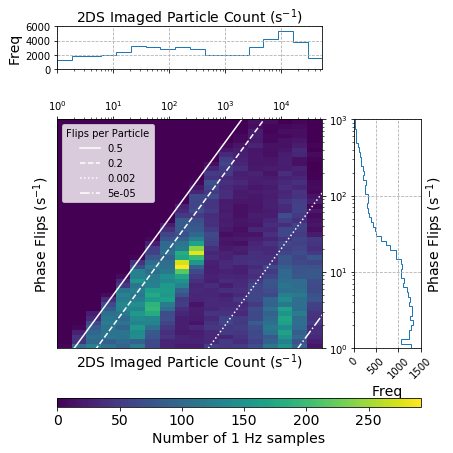

In [12]:
    
#plotting data    

gs = GridSpec(5,4, height_ratios=[1,1,1,1,0.2])
fig = plt.figure(figsize=(6.4,6.4))
ax = fig.add_subplot(gs[1:4,0:3])
ax_marg_x = fig.add_subplot(gs[0,0:3], sharex=ax)
ax_marg_y = fig.add_subplot(gs[1:4,3], sharey=ax)
ax_cb = fig.add_subplot(gs[4, 0:4])


xbins = 10**np.linspace(0, 5, 20)
ybins = 10**np.linspace(0, 3, 50)

_,_,_,sc = ax.hist2d(full_counts, flips, bins=(xbins, ybins),)
ax.set_xlabel('2DS Imaged Particle Count '+r"(s$^{-1}$)",fontsize=14)
ax.set_ylabel('Phase Flips '+r"(s$^{-1}$)",fontsize=14)
for val, ls in zip((0.5, 0.2, 0.002, 0.00005), ('w', '--w', ':w', '-.w')):
    ax.plot([1,1e5],[val,1e5*val], ls, label=str(val))



cb = plt.colorbar(sc, cax=ax_cb, orientation='horizontal')
ax_cb.set_xlabel('Number of 1 Hz samples', fontsize=14)
cb.ax.tick_params(labelsize=14)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim((1, 5.4e4))
ax.set_ylim((1, 1e3))
ax.legend(title = 'Flips per Particle')
# ax.set_xlim((10, 1e3))

# ax.tick_params(axis="x", bottom=False, top=True, labelbottom=False, labeltop=True)
# ax.tick_params(axis="x", bottom=False, top=True, labelbottom=False, labeltop=True)
ax.xaxis.tick_top()
ax.yaxis.tick_right()


ax_marg_x.hist(full_counts, histtype='step', bins=xbins)
# ax_marg_x.set_yscale('log')
ax_marg_x.set_yticks([0, 2e3, 4e3, 6e3])
ax_marg_x.grid(True, ls='--')
ax_marg_x.set_xlabel('2DS Imaged Particle Count '+r"(s$^{-1}$)",fontsize=14)
ax_marg_x.set_ylabel('Freq',fontsize=14)
ax_marg_x.xaxis.set_label_position('top')

# ax_marg_x.set_yticklabels([1e3, 2e3])



ax_marg_y.hist(flips, histtype='step', orientation="horizontal", bins=ybins)
# ax_marg_y.set_xscale('log')
ax_marg_y.set_xticks([0, 5e2, 1e3, 1.5e3])
ax_marg_y.set_xticklabels([int(i) for i in ax_marg_y.get_xticks()], rotation=45)
ax_marg_y.grid(True, ls='--')
ax_marg_y.set_ylabel('Phase Flips '+r"(s$^{-1}$)",fontsize=14)
ax_marg_y.set_xlabel('Freq',fontsize=14)
ax_marg_y.yaxis.set_label_position('right')
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

plt.tight_layout(h_pad=0., w_pad=0.)